In [13]:
import duckdb
import fkmob
import pandas as pd
import seaborn as sns
from fkmob.models import DensityEPR
from skmob_vis import plot_jump_lengths_ecdf
from fkmob.comparison import wasserstein_distance
import skmob_vis

In [14]:
tessellation = pd.DataFrame({
    "tile_id": [0, 1, 2],
    "lat": [45.0, 45.1, 45.2],
    "lng": [7.0, 7.1, 7.2],
    "population": [100, 200, 300],
})

model = DensityEPR()

traj = model.generate(
    start_date=pd.Timestamp("2020-01-01 00:00:00"),
    end_date=pd.Timestamp("2020-01-02 00:00:00"),
    spatial_tessellation=tessellation,
    n_agents=100,
    relevance_column="population",
    random_state=42,
)

print(traj.head())

   uid            datetime   lat  lng
0    1 2020-01-01 00:00:00  45.2  7.2
1    1 2020-01-01 00:53:40  45.1  7.1
2    1 2020-01-01 03:04:01  45.2  7.2
3    1 2020-01-01 03:54:21  45.0  7.0
4    1 2020-01-01 04:31:34  45.2  7.2


# Get Île-de-France h3 (resolution 10) cells - SMALL FOR NOW

In [3]:
h3_cells = duckdb.sql("""
INSTALL h3 FROM community;
LOAD h3;

WITH bbox AS (
    SELECT 'POLYGON((1.6 48.5, 2.975 48.5, 2.975 49.16, 1.6 49.16, 1.6 48.5))' AS wkt
),
unnested_cells AS (
    SELECT 
        UNNEST(h3_polygon_wkt_to_cells(wkt, 10)) AS h3_res10
    FROM bbox
)
SELECT 
    h3_res10,
    h3_cell_to_lat(h3_res10) AS centroid_lat,
    h3_cell_to_lng(h3_res10) AS centroid_lon,
    h3_cell_to_boundary_wkt(h3_res10) AS cell_polygon_wkt
FROM unnested_cells
ORDER BY h3_res10;
""")

h3_cells.show()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

┌────────────────────┬────────────────────┬────────────────────┬────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│      h3_res10      │    centroid_lat    │    centroid_lon    │                                                                    cell_polygon_wkt                                                                    │
│       uint64       │       double       │       double       │                                                                        varchar                                                                         │
├────────────────────┼────────────────────┼────────────────────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│ 622054205804281855 │  48.50196355750077 │ 2.7585033438550437 │ POLYGON ((2.758695 48.502607, 2.757801 48.502445, 2.757609 48.5

# Enrich with the quantity of POIs found on Overture

In [ ]:
h3_cells_enriched = duckdb.sql(""" 
INSTALL spatial;
LOAD spatial;
INSTALL h3 FROM community;
LOAD h3;

SET s3_region='us-west-2';

WITH grouped_pois AS (
    SELECT
        -- 1. Map POIs to H3 strings and count them immediately
        h3_latlng_to_cell_string(ST_Y(geometry), ST_X(geometry), 10) AS h3_res10,
        COUNT(*) AS total_poi_count
    FROM
        read_parquet('s3://overturemaps-us-west-2/release/2026-05-20.0/theme=places/type=place/*', filename=true, hive_partitioning=1)
    WHERE
        bbox.xmin BETWEEN 1.6 AND 2.975
        AND bbox.ymin BETWEEN 48.5 AND 49.16
    GROUP BY 
        h3_res10
)
SELECT
    h3_res10,
    -- 2. Convert the string back to a native H3 cell for the geometry functions
    h3_cell_to_lat(h3_string_to_h3(h3_res10)) AS lat,
    h3_cell_to_lng(h3_string_to_h3(h3_res10)) AS lon,
    h3_cell_to_boundary_wkt(h3_string_to_h3(h3_res10)) AS cell_polygon_wkt,
    total_poi_count
FROM 
    grouped_pois
ORDER BY 
    total_poi_count DESC;
""").df()

h3_cells_enriched.to_parquet("../../data/idf/h3_cells_enriched.parquet", index=False)

h3_cells_enriched

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,h3_res10,lat,lon,cell_polygon_wkt,total_poi_count
0,8a1fb475b457fff,48.870418,2.305666,"POLYGON ((2.305855 48.871062, 2.304952 48.8708...",573
1,8a1fb475b417fff,48.870242,2.301342,"POLYGON ((2.301531 48.870885, 2.300628 48.8707...",467
2,8a1fb475b397fff,48.873509,2.315973,"POLYGON ((2.316162 48.874153, 2.315260 48.8739...",331
3,8a1fb475b44ffff,48.870910,2.308374,"POLYGON ((2.308563 48.871554, 2.307660 48.8713...",289
4,8a1fb467585ffff,48.865681,2.329901,"POLYGON ((2.330091 48.866324, 2.329188 48.8661...",274
...,...,...,...,...,...
69780,8a1fb08967b7fff,48.524205,2.569527,"POLYGON ((2.569718 48.524850, 2.568822 48.5246...",1
69781,8a1fb0c65d57fff,48.516900,2.549573,"POLYGON ((2.549764 48.517544, 2.548868 48.5173...",1
69782,8a1fb4653617fff,48.757911,2.363906,"POLYGON ((2.364095 48.758555, 2.363194 48.7583...",1
69783,8a1fb43b0547fff,49.096315,2.261699,"POLYGON ((2.261888 49.096958, 2.260982 49.0967...",1


In [22]:
unique_categories = duckdb.sql(""" 
INSTALL spatial;
LOAD spatial;

SET s3_region='us-west-2';

WITH bbox_geom AS (
    -- Renamed to avoid name clashing with Overture's bbox column
    SELECT ST_GeomFromText('POLYGON((1.6 48.5, 2.975 48.5, 2.975 49.16, 1.6 49.16, 1.6 48.5))') AS geom
)
SELECT DISTINCT
    categories.primary AS primary_category,
    'UNKNOWN' AS purpose  -- String literals use single quotes in SQL
FROM
    read_parquet('s3://overturemaps-us-west-2/release/2026-05-20.0/theme=places/type=place/*', filename=true, hive_partitioning=1)
CROSS JOIN 
    bbox_geom
WHERE
    -- 1. Use the Parquet file's native bbox struct for partition/row-group skipping
    bbox.xmin BETWEEN 1.6 AND 2.975
    AND bbox.ymin BETWEEN 48.5 AND 49.16
    -- 2. Exact spatial filtering
    AND ST_Within(geometry, bbox_geom.geom)
ORDER BY 
    primary_category;
""").df()

# Save the unique categories to a clean CSV file
unique_categories.to_csv("../../data/idf/unique_categories.csv", index=False)

unique_categories

,primary_category,purpose
0,abuse_and_addiction_treatment,UNKNOWN
1,academic_bookstore,UNKNOWN
2,accommodation,UNKNOWN
3,accountant,UNKNOWN
4,active_life,UNKNOWN
...,...,...
1109,writing_service,UNKNOWN
1110,yoga_studio,UNKNOWN
1111,youth_organizations,UNKNOWN
1112,zoo,UNKNOWN


# Generate 500 agents

In [3]:
h3_cells_enriched = duckdb.sql("""SELECT * FROM read_parquet('../../data/idf/h3_cells_enriched.parquet')""").df()
h3_cells_enriched

,h3_res10,lat,lon,cell_polygon_wkt,total_poi_count
0,8a1fb475b457fff,48.870418,2.305666,"POLYGON ((2.305855 48.871062, 2.304952 48.8708...",573
1,8a1fb475b417fff,48.870242,2.301342,"POLYGON ((2.301531 48.870885, 2.300628 48.8707...",467
2,8a1fb475b397fff,48.873509,2.315973,"POLYGON ((2.316162 48.874153, 2.315260 48.8739...",331
3,8a1fb475b44ffff,48.870910,2.308374,"POLYGON ((2.308563 48.871554, 2.307660 48.8713...",289
4,8a1fb467585ffff,48.865681,2.329901,"POLYGON ((2.330091 48.866324, 2.329188 48.8661...",274
...,...,...,...,...,...
69780,8a1fb08967b7fff,48.524205,2.569527,"POLYGON ((2.569718 48.524850, 2.568822 48.5246...",1
69781,8a1fb0c65d57fff,48.516900,2.549573,"POLYGON ((2.549764 48.517544, 2.548868 48.5173...",1
69782,8a1fb4653617fff,48.757911,2.363906,"POLYGON ((2.364095 48.758555, 2.363194 48.7583...",1
69783,8a1fb43b0547fff,49.096315,2.261699,"POLYGON ((2.261888 49.096958, 2.260982 49.0967...",1


In [4]:
gparis_trips = duckdb.sql("""
SELECT * FROM read_parquet('../../data/gparis_sample_trip_with_lengths.parquet')
""").df()
gparis_trips

,ID,Date_EMG,day_of_week,ID_Trip_Days,Date_O,Time_O,Code_INSEE_O,Date_D,Time_D,Code_INSEE_D,Purpose_D,Main_Mode,Duration,Weight_Day,_start_time,_end_time,trip_length_km,day_period
0,42_0030,2022-10-17,monday,1,2022-10-17,08:32:00,75112,2022-10-17,08:36:00,75112,WORK,OTHER,4.0,494.343911,2022-10-17 08:32:00,2022-10-17 08:36:00,0.390234,Morning (06:00-11:59)
1,42_0030,2022-10-17,monday,2,2022-10-17,16:00:00,75112,2022-10-17,16:09:00,75112,WORK,OTHER,9.0,494.343911,2022-10-17 16:00:00,2022-10-17 16:09:00,0.935792,Afternoon (12:00-17:59)
2,42_0030,2022-10-17,monday,3,2022-10-17,17:00:00,75112,2022-10-17,17:07:00,75112,WORK,OTHER,7.0,494.343911,2022-10-17 17:00:00,2022-10-17 17:07:00,0.878903,Afternoon (12:00-17:59)
3,42_0030,2022-10-17,monday,4,2022-10-17,18:03:00,75112,2022-10-17,18:09:00,75112,HOME,OTHER,6.0,494.343911,2022-10-17 18:03:00,2022-10-17 18:09:00,1.451918,Evening (18:00-23:59)
4,42_0030,2022-10-18,tuesday,1,2022-10-18,08:19:00,75112,2022-10-18,08:44:00,75112,WORK,OTHER,25.0,498.780561,2022-10-18 08:19:00,2022-10-18 08:44:00,2.352613,Morning (06:00-11:59)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15516,4_2380,2023-01-29,sunday,4,2023-01-29,13:46:00,78688,2023-01-29,14:07:00,78168,PURCHASE,PRIV_CAR,21.0,305.602630,2023-01-29 13:46:00,2023-01-29 14:07:00,11.069083,Afternoon (12:00-17:59)
15517,4_2380,2023-01-29,sunday,5,2023-01-29,14:18:00,78168,2023-01-29,14:20:00,78168,PURCHASE,PRIV_CAR,2.0,305.602630,2023-01-29 14:18:00,2023-01-29 14:20:00,1.042213,Afternoon (12:00-17:59)
15518,4_2380,2023-01-29,sunday,6,2023-01-29,14:43:00,78168,2023-01-29,15:06:00,78688,HOME,PRIV_CAR,23.0,305.602630,2023-01-29 14:43:00,2023-01-29 15:06:00,12.550192,Afternoon (12:00-17:59)
15519,4_2380,2023-01-29,sunday,7,2023-01-29,16:15:00,78688,2023-01-29,17:00:00,78688,LEISURE,OTHER,45.0,305.602630,2023-01-29 16:15:00,2023-01-29 17:00:00,0.000000,Afternoon (12:00-17:59)


In [5]:
model = DensityEPR()

traj1 = model.generate(
    start_date=pd.Timestamp("2023-03-05 00:00:00"),
    end_date=pd.Timestamp("2023-03-11 00:00:00"),
    spatial_tessellation=h3_cells_enriched,
    n_agents=500,
    relevance_column="total_poi_count",
    random_state=42,
)

traj1 = fkmob.TrajDataFrame(traj1)

traj1

,uid,datetime,lat,lng
0,1,2023-03-05 00:00:00,48.738159,2.192705
1,1,2023-03-05 00:53:40,48.698200,2.187902
2,1,2023-03-05 03:04:01,48.738159,2.192705
3,1,2023-03-05 03:54:21,48.848688,2.343689
4,1,2023-03-05 04:31:34,48.738159,2.192705
...,...,...,...,...
47542,500,2023-03-10 07:19:31,48.848056,2.346918
47543,500,2023-03-10 22:32:10,48.839700,2.347874
47544,500,2023-03-10 22:54:36,48.860623,2.355742
47545,500,2023-03-10 23:26:29,48.848688,2.343689


# Compare Results - Improve SKMOB 2 alongside

In [6]:
jump_lenghts1 = traj1.jump_lengths(merge=True)
jump_lenghts2 = gparis_trips["trip_length_km"].dropna().tolist()

<Axes: ylabel='Proportion'>

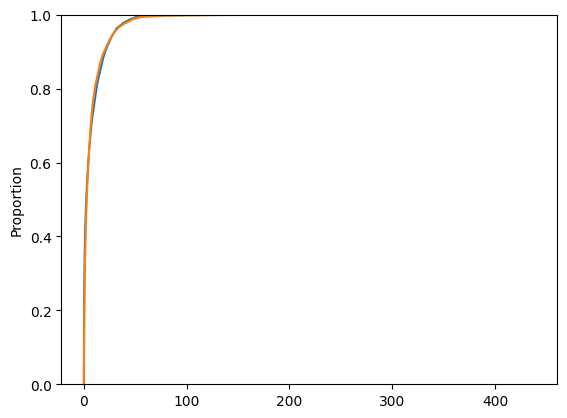

In [7]:
sns.ecdfplot(jump_lenghts1)
sns.ecdfplot(jump_lenghts2)

In [9]:
figure = plot_jump_lengths_ecdf(jump_lenghts1, jump_lenghts2, labels=("observed", "synthetic"))
figure

EChartsFigure(option_json='{"_meta": {"xUnit": "km", "xLabel": "jump length"}, "backgroundColor": "#fbf8f1", "animation": false, "textStyle": {"fontFamily": "\\"IBM Plex Sans\\", system-ui, sans-serif", "color": "#14110d"}, "title": {"text": "Jump length ECDF", "left": 0, "top": 0, "textStyle": {"fontFamily": "\\"IBM Plex Serif\\", Georgia, serif", "fontWeight": 500, "fontSize": 32, "color": "#14110d"}}, "legend": {"right": 0, "top": 12, "itemWidth": 24, "itemHeight": 8, "itemGap": 22, "textStyle": {"fontFamily": "\\"IBM Plex Sans\\", system-ui, sans-serif", "fontSize": 15, "color": "#14110d"}}, "grid": {"left": 76, "right": 28, "top": 64, "bottom": 64, "containLabel": false}, "xAxis": {"type": "value", "min": 0, "splitNumber": 5, "name": "JUMP LENGTH \\u00b7 KM", "nameLocation": "middle", "nameGap": 38, "nameTextStyle": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 14, "color": "#14110d"}, "axisLine": {"lineStyle": {"color": "#14110d", "width": 1.5}}, "axisTick": {"lineStyle": {"color": "#14110d", "width": 1.25}, "length": 6}, "axisLabel": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 16, "color": "#14110d"}, "splitLine": {"show": false}}, "yAxis": {"type": "value", "min": 0, "max": 1, "interval": 0.2, "name": "F(X)", "nameLocation": "middle", "nameGap": 56, "nameRotate": 90, "nameTextStyle": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 14, "color": "#14110d"}, "axisLine": {"lineStyle": {"color": "#14110d", "width": 1.5}}, "axisTick": {"lineStyle": {"color": "#14110d", "width": 1.25}, "length": 6}, "axisLabel": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 16, "color": "#14110d"}, "splitLine": {"lineStyle": {"color": "#dcd5c4", "type": [2, 5], "width": 1}}}, "tooltip": {"trigger": "axis", "axisPointer": {"type": "line", "lineStyle": {"color": "#14110d", "type": [2, 4], "width": 1, "opacity": 0.55}, "label": {"show": false}}, "backgroundColor": "#fbf8f1", "borderColor": "#14110d", "borderWidth": 1.25, "padding": [10, 14], "extraCssText": "border-radius:0; box-shadow:none; min-width:210px;", "textStyle": {"color": "#14110d"}}, "series": [{"name": "observed", "type": "line", "data": [[0.11943603474907971, 0.00010627670202138288], [0.11943800149133219, 0.00012753204242565945], [0.11944375479248438, 0.00014878738282993602], [0.11944445928896705, 0.00019129806363848918], [0.11946635527479577, 0.0004888728292983612], [0.11946705967338236, 0.0005313835101069144], [0.11946989014879368, 0.0005738941909154675], [0.11947562917082293, 0.0006164048717240206], [0.11947645060518347, 0.0006376602121282972], [0.1194777797033297, 0.0006589155525325738], [0.11948740123652306, 0.0006801708929368503], [0.11949779395963074, 0.0007014262333411269], [0.11950779237484235, 0.00074393691414968], [0.11950834353926416, 0.0008077029353625099], [0.11950944552632674, 0.0008927242969796162], [0.11951095770762508, 0.0009139796373838927], [0.11951117707681513, 0.0009564903181924459], [0.11951221913025409, 0.0010202563394052756], [0.11951292385771912, 0.0010840223606181053], [0.11951348052856389, 0.0011052777010223818], [0.1195141852759853, 0.0011690437222352116], [0.11953401973486137, 0.0012115544030437647], [0.1195344317734004, 0.0012328097434480413], [0.11953865407047087, 0.0012540650838523178], [0.11958040708405625, 0.0014028524666822538], [0.11959338727515792, 0.001445363147490807], [0.1195980017516751, 0.0014666184878950835], [0.11959830177980206, 0.00148787382829936], [0.11961874867454177, 0.001509129168703637], [0.11963423455637427, 0.00155163984951219], [0.11963549247125436, 0.0016366612111292963], [0.1196435994654139, 0.0016579165515335729], [0.11964556304840575, 0.001700427232342126], [0.11964752659418099, 0.0017216825727464026], [0.11967322475599557, 0.0017429379131506792], [0.11968440866063211, 0.0017854485939592323], [0.11968930164319917, 0.002040

In [9]:
wasserstein_distance(jump_lenghts1, jump_lenghts2)

0.939110275018792

In [10]:
figure.to_html("test.html")

PosixPath('test.html')

# Allow LLM to set the values

Using Gemini

```python
class DensityEPR(EPR):

    def __init__(

        self,

        name="Density EPR model",

        rho=0.6,

        gamma=0.21,

        beta=0.8,

        tau=17,

        min_wait_time_minutes=20,

    ):

        super().__init__(

            rho=rho,

            gamma=gamma,

            beta=beta,

            tau=tau,

            min_wait_time_minutes=min_wait_time_minutes,

        )

        self._name = name
```


This is the ecdf plot of this model. You goal is to choose new values so the behavior better matches the behavior of citizens of Île-de-France: (IMAGE PLOT OF THE CURRENT VERSION)

In [13]:
model = DensityEPR(rho=0.4, gamma=0.21, beta=1.3, tau=24, min_wait_time_minutes=15)

traj1 = model.generate(
    start_date=pd.Timestamp("2023-03-05 00:00:00"),
    end_date=pd.Timestamp("2023-03-11 00:00:00"),
    spatial_tessellation=h3_cells_enriched,
    n_agents=500,
    relevance_column="total_poi_count",
    random_state=42,
)

traj1 = fkmob.TrajDataFrame(traj1)
jump_lenghts1 = traj1.jump_lengths(merge=True)
traj1

,uid,datetime,lat,lng
0,1,2023-03-05 00:00:00,48.738159,2.192705
1,1,2023-03-05 00:21:23,48.764900,2.165499
2,1,2023-03-05 00:40:17,48.764587,2.167115
3,1,2023-03-05 01:18:57,48.738159,2.192705
4,1,2023-03-05 01:40:43,48.764587,2.167115
...,...,...,...,...
96039,500,2023-03-10 22:06:00,48.853182,2.341596
96040,500,2023-03-10 22:29:57,48.852515,2.334569
96041,500,2023-03-10 23:00:38,48.854622,2.339458
96042,500,2023-03-10 23:21:33,48.853007,2.337275


In [14]:
figure = plot_jump_lengths_ecdf(jump_lenghts1, jump_lenghts2, labels=("observed", "synthetic"))
print(wasserstein_distance(jump_lenghts1, jump_lenghts2))
figure

1.2000779561785773


EChartsFigure(option_json='{"backgroundColor":"white","grid":[{"bottom":"10%","containLabel":true,"left":"8%","right":"4%"}],"legend":{"data":[{"name":"observed"},{"name":"synthetic"}]},"series":[{"data":[[0.1194412304199397,0.00008373105584861426],[0.11946635527479577,0.00010466381981076781],[0.11946843691679973,0.00011513020179184459],[0.11946989014879368,0.00013606296575399815],[0.11947841699816973,0.00014652934773507493],[0.11949567150972583,0.00015699572971615173],[0.11949763774497818,0.0001674621116972285],[0.11949976224264053,0.00037678975131876413],[0.11950173048961019,0.00047098718914845517],[0.11950850076429734,0.0004814535711295319],[0.11950944552632674,0.0005023863350916855],[0.11951151435011485,0.0005233190990538391],[0.11951221913025409,0.0005547182449970694],[0.11951292385771912,0.0005651846269781462],[0.11951348052856389,0.000575651008959223],[0.11951474190612868,0.0006175165368835301],[0.11951488997073509,0.0006279829188646069],[0.11952673880757762,0.0006384493008456837],[0.11953143525568163,0.0006593820648078372],[0.11958040708405625,0.0006803148287699908],[0.11959338727515792,0.0007012475927321444],[0.11960433359894203,0.0007431131206564515],[0.11960676238046171,0.0007535795026375283],[0.1196087326053957,0.000764045884618605],[0.1196088174606875,0.0008059114125429121],[0.11961174800516436,0.000816377794523989],[0.11961332491840404,0.0009524407602779871],[0.11961529210579856,0.0009733735242401407],[0.11962071594869338,0.0009838399062212174],[0.11962271667436224,0.0009943062882022942],[0.11963675036370808,0.0010152390521644477],[0.11963939517267635,0.0010361718161266014],[0.11964149274321548,0.001057104580088755],[0.11964219503617596,0.0010780373440509084],[0.11964345642654352,0.0011408356359373692],[0.11964415868944026,0.001151302017918446],[0.11964556304840575,0.0012245666917859834],[0.11964682447749594,0.0012559658377292139],[0.11964752659418099,0.0012768986016913674],[0.11964878802164687,0.0012978313656535209],[0.11967322475599557,0.0013920288034832118],[0.11967753998782668,0.0014024951854642888],[0.11967922189165173,0.0014129615674453656],[0.11968244619298694,0.0014443607133885958],[0.11968258564535592,0.001486226241312903],[0.11968440866063211,0.0016536883530101315],[0.11968846442130819,0.0016641547349912082],[0.11970459442803143,0.0016850874989533617],[0.11971854320082943,0.0017060202629155155],[0.11971980587424362,0.001779284936783053],[0.1197205040252096,0.0018106840827262832],[0.1197235120125767,0.00182115046470736],[0.11973232347760521,0.0019258142845181277],[0.11973302822604277,0.0019362806664992046],[0.11973428752548858,0.0021665410700828936],[0.11973434465076983,0.002187473834045047],[0.1197355640124939,0.0023130704178179686],[0.11973821193027089,0.0023235367997990453],[0.11974184286935365,0.0023654023277233528],[0.11974933361459701,0.0023758687097044295],[0.11976046066650449,0.0023863350916855063],[0.11976714537691084,0.0024072678556476598],[0.1197718576991481,0.0024177342376287365],[0.11977311493083269,0.0024282006196098133],[0.11977381172430705,0.0024491333835719668],[0.11977451330150447,0.0025119316754584277],[0.11977508026499295,0.0025956627313070417],[0.11977577376538188,0.002627061877250272],[0.1197764753103582,0.002773591224985347],[0.11977717679954634,0.0027945239889475004],[0.11979783493760565,0.0028154567529096544],[0.11979979856671168,0.002825923134890731],[0.11980105698349316,0.002836389516871808],[0.11980176215887668,0.0028887214267771916],[0.1198025323145846,0.0028991878087582684],[0.11980730098978838,0.002920120572720422],[0.11981248351716302,0.0029410533366825754],[0.11981388277287609,0.00302478439253119],[0.11981514382528625,0.0030352507745122666],[0.11981584339112322,0.0030457171564933433],[0.11981615623571958,0.0031085154483798043],[0.11981710444281654,0.0031922465042284183],[0.11981906502138263,0.0032969103240391862],[0.11982198606118892,0.003307376706020263],[0.1198356730437445,0.0033387758519634932],[0.1198378884794222,0.00334924223394457],[0.11983986835378553,0.00335970861

This is the ecdf plot of your chosen parameters. You goal is to choose new values so the behavior better matches the behavior of citizens of Île-de-France: 

In [16]:
model = DensityEPR(rho=0.4, gamma=0.1, beta=0.15, tau=24, min_wait_time_minutes=15)

traj1 = model.generate(
    start_date=pd.Timestamp("2023-03-05 00:00:00"),
    end_date=pd.Timestamp("2023-03-11 00:00:00"),
    spatial_tessellation=h3_cells_enriched,
    n_agents=500,
    relevance_column="total_poi_count",
    random_state=42,
)

traj1 = fkmob.TrajDataFrame(traj1)
jump_lenghts1 = traj1.jump_lengths(merge=True)
traj1

,uid,datetime,lat,lng
0,1,2023-03-05 00:00:00,48.990653,1.905531
1,1,2023-03-05 03:28:27,48.934188,2.344955
2,1,2023-03-05 04:09:03,48.990653,1.905531
3,1,2023-03-05 04:30:26,48.934188,2.344955
4,1,2023-03-05 18:40:41,48.990653,1.905531
...,...,...,...,...
16774,500,2023-03-10 10:22:51,48.902415,2.030119
16775,500,2023-03-10 11:54:31,48.843263,2.407816
16776,500,2023-03-10 18:26:50,49.118594,1.834059
16777,500,2023-03-10 20:27:23,48.862418,2.419449


In [17]:
figure = plot_jump_lengths_ecdf(jump_lenghts1, jump_lenghts2, labels=("observed", "synthetic"))
print(wasserstein_distance(jump_lenghts1, jump_lenghts2))
figure

10.825099083131715


EChartsFigure(option_json='{"backgroundColor":"white","grid":[{"bottom":"10%","containLabel":true,"left":"8%","right":"4%"}],"legend":{"data":[{"name":"observed"},{"name":"synthetic"}]},"series":[{"data":[[2.203208858151218,0.00006142883469500583],[2.2034710094221044,0.0012285766939001167],[2.2038948252706945,0.0022728668837152157],[2.204156784690817,0.0023342957184102216],[2.204580585097256,0.003010012900055286],[2.2046397372966533,0.0030714417347502917],[2.204902729363679,0.0031328705694452976],[2.2071203157716766,0.0032557282388353094],[2.2073828621909426,0.0034400147429203267],[2.2079393143532595,0.0035014435776153327],[2.208068118457023,0.0035628724123103386],[2.2089691683041157,0.0036243012470053445],[2.2090150002535904,0.00368573008170035],[2.209176028436477,0.003747158916395356],[2.209916860649495,0.0038085877510903618],[2.210059106864771,0.004115731924565391],[2.210249500419115,0.004177160759260397],[2.2105454411932177,0.004238589593955402],[2.210766477465179,0.004300018428650409],[2.2110029842849688,0.004361447263345414],[2.211589806916048,0.0044228760980404205],[2.212074987872337,0.004484304932735426],[2.212205096975483,0.004668591436820443],[2.2122734108597166,0.00473002027151545],[2.2122981822365784,0.005037164444990479],[2.2124957408317547,0.005098593279685484],[2.2125334925314144,0.005344308618465508],[2.212816550183656,0.005405737453160513],[2.2128589443410314,0.00546716628785552],[2.212956798061943,0.005590023957245531],[2.213181281863604,0.0057128816266355424],[2.213216682993228,0.005774310461330549],[2.2132816885594098,0.005958596965415566],[2.213542485964672,0.0064500276429756125],[2.213601649758698,0.006757171816450642],[2.2136399677367105,0.007064315989925671],[2.2137042812652195,0.007125744824620677],[2.2137106114733176,0.007985748510350759],[2.2137354720248372,0.008047177345045764],[2.2139652086605546,0.00810860617974077],[2.213974790975208,0.008231463849130783],[2.2140631015593413,0.008354321518520794],[2.214225809695976,0.0084157503532158],[2.214287496716068,0.008538608022605811],[2.21438777946472,0.008845752196080841],[2.214522868220866,0.008968609865470852],[2.214582409302409,0.009091467534860863],[2.214908914731967,0.009275754038945882],[2.2149351310171186,0.009337182873640886],[2.2150056512994887,0.009521469377725904],[2.2150710589905236,0.010074328889980957],[2.2151689918939224,0.010504330732845998],[2.2152324636668803,0.010811474906321027],[2.2152649435587124,0.010872903741016033],[2.215493454801888,0.01105719024510105],[2.215591800280679,0.01136433441857608],[2.215628915899186,0.011425763253271085],[2.2156881636094345,0.011671478592051109],[2.2157541190494263,0.012162909269611156],[2.215851679855513,0.013330057128816266],[2.215921280736692,0.013391485963511272],[2.2159472574927905,0.013452914798206279],[2.2161112316049905,0.01400577431046133],[2.2161324588498945,0.014067203145156337],[2.216176491805813,0.014128631979851342],[2.2162744655446653,0.014865777996191413],[2.2163704551977546,0.015295779839056453],[2.2164369588451436,0.015418637508446464],[2.2164490644193537,0.01548006634314147],[2.2165341471255573,0.01990294244118189],[2.2165653247686805,0.020025800110571902],[2.2165987110479826,0.02008722894526691],[2.2166970982656844,0.02033294428404693],[2.2167935004826833,0.024755820382087353],[2.2169569097290736,0.02623011241476749],[2.216975547105087,0.02641439891885251],[2.217052525283586,0.027274402604582592],[2.217133130320564,0.0273358314392776],[2.2171461537144466,0.0273972602739726],[2.2172163929048296,0.035813010627188405],[2.217238299725178,0.03593586829657842],[2.2173112211953323,0.03612015480066343],[2.2173795189846297,0.036550156643528474],[2.217404061358027,0.03661158547822348],[2.2174755474579926,0.04699305854167946],[2.217541903058395,0.047115916211069475],[2.217639132034789,0.049818784937649734],[2.2177035446703948,0.049880213772344736],[2.2177101874142773,0.049941642607039746],[2.2177343730592884,0.050617359788684806],[2.217762825837765,0.05074021745807482],[2.21789841639623,0.05

This is the ecdf plot of your chosen parameters. You goal is to choose new values so the behavior better matches the behavior of citizens of Île-de-France: 

In [18]:
model = DensityEPR(rho=0.25, gamma=0.05, beta=0.02, tau=24, min_wait_time_minutes=15)

traj1 = model.generate(
    start_date=pd.Timestamp("2023-03-05 00:00:00"),
    end_date=pd.Timestamp("2023-03-11 00:00:00"),
    spatial_tessellation=h3_cells_enriched,
    n_agents=500,
    relevance_column="total_poi_count",
    random_state=42,
)

traj1 = fkmob.TrajDataFrame(traj1)
jump_lenghts1 = traj1.jump_lengths(merge=True)
traj1

,uid,datetime,lat,lng
0,1,2023-03-05 00:00:00,48.990653,1.905531
1,1,2023-03-05 03:28:27,48.934188,2.344955
2,1,2023-03-05 04:09:03,48.990653,1.905531
3,1,2023-03-05 04:30:26,48.934188,2.344955
4,1,2023-03-05 18:40:41,48.990653,1.905531
...,...,...,...,...
13290,500,2023-03-09 05:00:59,48.861208,2.389214
13291,500,2023-03-09 09:49:49,48.857530,2.298462
13292,500,2023-03-10 02:25:34,48.872969,2.219235
13293,500,2023-03-10 14:26:10,49.118594,1.834059


In [19]:
figure = plot_jump_lengths_ecdf(jump_lenghts1, jump_lenghts2, labels=("observed", "synthetic"))
print(wasserstein_distance(jump_lenghts1, jump_lenghts2))
figure

13.0633145385227


EChartsFigure(option_json='{"backgroundColor":"white","grid":[{"bottom":"10%","containLabel":true,"left":"8%","right":"4%"}],"legend":{"data":[{"name":"observed"},{"name":"synthetic"}]},"series":[{"data":[[2.203208858151218,0.00007815552950371239],[2.2034710094221044,0.0011723329425556857],[2.2038948252706945,0.002032043767096522],[2.204580585097256,0.0027354435326299334],[2.2046397372966533,0.0028917545916373583],[2.204742931433278,0.0042985541227041815],[2.2066468483462565,0.004454865181711606],[2.2076450858981365,0.004533020711215319],[2.208068118457023,0.004689331770222743],[2.2083332409358,0.004767487299726455],[2.2089691683041157,0.005001953888237593],[2.209658793762362,0.005314576006252443],[2.209699638691808,0.005470887065259867],[2.210122614729896,0.005549042594763579],[2.210249500419115,0.005627198124267292],[2.2105454411932177,0.005783509183274717],[2.2105996115523077,0.005861664712778429],[2.2110682741267613,0.006017975771785854],[2.2113906436672215,0.0060961313012895665],[2.211491210570689,0.006174286830793279],[2.211522043506935,0.006330597889800703],[2.212205096975483,0.006643220007815553],[2.2122981822365784,0.006799531066822978],[2.2124957408317547,0.006955842125830403],[2.2125334925314144,0.007190308714341539],[2.2127932477680083,0.007268464243845252],[2.212816550183656,0.007346619773348964],[2.212956798061943,0.007581086361860102],[2.213181281863604,0.0088315748339195],[2.213216682993228,0.008909730363423213],[2.2134430278454285,0.009066041422430638],[2.213542485964672,0.009613130128956624],[2.2136399677367105,0.009691285658460336],[2.2138029570778457,0.009769441187964049],[2.213899655515957,0.00984759671746776],[2.213994375461474,0.009925752246971474],[2.214010109043823,0.010082063305978897],[2.214225809695976,0.010550996483001172],[2.2142386464906796,0.010629152012504885],[2.214322919078506,0.010863618601016022],[2.21438777946472,0.011723329425556858],[2.214447532278319,0.011879640484564283],[2.2145021776811147,0.012035951543571708],[2.2148101979437187,0.012192262602579133],[2.214869253996196,0.012270418132082845],[2.214908914731967,0.013520906604142242],[2.2151689918939224,0.013989839781164517],[2.2151865368389525,0.014146150840171942],[2.2154508987556865,0.014224306369675654],[2.215493454801888,0.014302461899179367],[2.2155008553485107,0.014380617428683079],[2.215591800280679,0.014615084017194217],[2.2156881636094345,0.014927706135209067],[2.2157541190494263,0.01508401719421649],[2.215851679855513,0.015240328253223915],[2.215915697478395,0.01570926143024619],[2.215921280736692,0.015943728018757326],[2.2159472574927905,0.016021883548261038],[2.2160408508518086,0.016100039077764753],[2.216206022953966,0.016412661195779603],[2.2162744655446653,0.016647127784290738],[2.2162916507829267,0.01672528331379445],[2.2163704551977546,0.017116060961313014],[2.2164644596610703,0.017194216490816726],[2.2165341471255573,0.019148104728409537],[2.2166970982656844,0.019773348964439233],[2.2167935004826833,0.022196170379054317],[2.216859308158239,0.022352481438061744],[2.2169569097290736,0.023212192262602578],[2.217052525283586,0.023681125439624855],[2.2172163929048296,0.028526768268855023],[2.2173112211953323,0.028683079327862446],[2.2173795189846297,0.029386479093395857],[2.2174755474579926,0.033528722157092614],[2.217541903058395,0.03360687768659633],[2.217639132034789,0.034544744040640875],[2.2176616391862845,0.03462289957014459],[2.2177101874142773,0.03501367721766315],[2.2177343730592884,0.03548261039468542],[2.2178019744592588,0.035560765924189136],[2.2178169756888617,0.03571707698319656],[2.21789841639623,0.0365767878077374],[2.218061717437009,0.03665494333724111],[2.2180954358645075,0.03759280969128566],[2.2181573717413343,0.04009378663540446],[2.2182510360712224,0.040171942164908166],[2.2183211316635107,0.040797186400937865],[2.218342709340104,0.041031652989449004],[2.2184159977324027,0.04126611957796014],[2.2184459134105965,0.04196951934349355],[2.218688645739852,0.042438452520515826],[2.2187436928239634,0.042672

I've acess to the ground truth, and your changes only made the synthetic worse. Try again.

In [20]:
model = DensityEPR(rho=0.6, gamma=0.35, beta=0.8, tau=8, min_wait_time_minutes=10)

traj1 = model.generate(
    start_date=pd.Timestamp("2023-03-05 00:00:00"),
    end_date=pd.Timestamp("2023-03-11 00:00:00"),
    spatial_tessellation=h3_cells_enriched,
    n_agents=500,
    relevance_column="total_poi_count",
    random_state=42,
)

traj1 = fkmob.TrajDataFrame(traj1)
jump_lenghts1 = traj1.jump_lengths(merge=True)
traj1

,uid,datetime,lat,lng
0,1,2023-03-05 00:00:00,48.990653,1.905531
1,1,2023-03-05 01:14:29,48.934188,2.344955
2,1,2023-03-05 01:33:01,48.990653,1.905531
3,1,2023-03-05 01:45:08,48.938244,1.992501
4,1,2023-03-05 01:56:26,48.950905,2.295990
...,...,...,...,...
95403,500,2023-03-10 22:36:43,48.895793,1.878228
95404,500,2023-03-10 22:58:14,49.118594,1.834059
95405,500,2023-03-10 23:10:04,48.852509,2.177351
95406,500,2023-03-10 23:30:00,48.820413,2.305498


In [21]:
figure = plot_jump_lengths_ecdf(jump_lenghts1, jump_lenghts2, labels=("observed", "synthetic"))
print(wasserstein_distance(jump_lenghts1, jump_lenghts2))
figure

10.232583352088302


EChartsFigure(option_json='{"backgroundColor":"white","grid":[{"bottom":"10%","containLabel":true,"left":"8%","right":"4%"}],"legend":{"data":[{"name":"observed"},{"name":"synthetic"}]},"series":[{"data":[[2.203208858151218,0.000010536519576853374],[2.2034710094221044,0.00013697475449909387],[2.2038948252706945,0.0013697475449909386],[2.204318495930062,0.0013908205841446453],[2.204447169288578,0.0014013571037214986],[2.204580585097256,0.0022653517090234754],[2.2046397372966533,0.002339107346061449],[2.204742931433278,0.002444472541829983],[2.204902729363679,0.002486618620137396],[2.2050042399450023,0.00256037425717537],[2.2055886325017746,0.0025814472963290765],[2.2062743268331677,0.0026130568550596367],[2.206536613281805,0.0026341298942133434],[2.20695981156111,0.0027184220508281705],[2.2069600288413564,0.002739495089981877],[2.2071203157716766,0.002792177687866144],[2.2073215357898675,0.0028027142074429972],[2.207381290765795,0.002813250727019851],[2.2073828621909426,0.002855396805327264],[2.2076450858981365,0.0028870063640578244],[2.2079393143532595,0.002897542883634678],[2.2079573311222918,0.0029396889619420913],[2.208068118457023,0.003150419353479159],[2.208267047196427,0.003160955873056012],[2.208330149060362,0.0031714923926328656],[2.2083332409358,0.003203101951363426],[2.2085471229889784,0.0032241749905171325],[2.2086907469361114,0.0032347115100939856],[2.2090150002535904,0.003361149745016226],[2.209176028436477,0.00340329582332364],[2.2093750336952787,0.003550807097399587],[2.209537702577682,0.0035613436169764402],[2.209699638691808,0.003603489695283854],[2.209860841579351,0.003614026214860707],[2.210059106864771,0.0036983183714755343],[2.2103840635788328,0.0037088548910523874],[2.2104147218806984,0.003719391410629241],[2.2105454411932177,0.003940658321743162],[2.2105996115523077,0.0039722678804737215],[2.210742965645729,0.004014413958781136],[2.2108070200115906,0.004056560037088549],[2.2108387736406545,0.004067096556665402],[2.210865992671914,0.004077633076242255],[2.210932610656092,0.004088169595819109],[2.211025165637299,0.0040987061153959625],[2.211098010661927,0.004109242634972816],[2.2113906436672215,0.0041197791545496696],[2.2114266092555037,0.004130315674126523],[2.211491210570689,0.004182998272010789],[2.211522043506935,0.0042251443503182025],[2.211752269545047,0.0042356808698950565],[2.211945927593901,0.00424621738947191],[2.212074987872337,0.004298899987356176],[2.2121100368917777,0.00434104606566359],[2.2121751856073923,0.004393728663547857],[2.212205096975483,0.0044780208201626835],[2.2122734108597166,0.0044885573397395375],[2.2122981822365784,0.004583386015931217],[2.2124360490392627,0.0046044590550849245],[2.2124957408317547,0.0048573355249294055],[2.2125334925314144,0.004888945083659966],[2.2125535412379427,0.004952164201121085],[2.2125979509672447,0.005025919838159059],[2.212628961390267,0.005046992877312766],[2.2127607593101755,0.005099675475197033],[2.2127932477680083,0.00518396763181186],[2.212816550183656,0.005205040670965566],[2.2128589443410314,0.0052366502296961265],[2.212956798061943,0.005394698023348928],[2.213052676238314,0.005405234542925781],[2.213119611811818,0.005436844101656341],[2.213181281863604,0.0057424031693850885],[2.213216682993228,0.0057529396889619425],[2.2132816885594098,0.0058793779238841826],[2.213311777610401,0.005889914443461036],[2.2133799530562244,0.006016352678383277],[2.2134430278454285,0.00602688919796013],[2.2134762410906728,0.006079571795844397],[2.2135010020717876,0.00609010831542125],[2.213542485964672,0.0061322543937286636],[2.213601649758698,0.0063640578244194375],[2.2136399677367105,0.006427276941880558],[2.2137042812652195,0.006437813461457411],[2.2137106114733176,0.006458886500611118],[2.2138029570778457,0.006490496059341678],[2.2138666071626028,0.006511569098495385],[2.213899655515957,0.0066274708138407724],[2.2139652086605546,0.006796055127070426],[2.213974790975208,0.006817128166224133],[2.213994375461474,0.006827664685800986],[2.2140631015593413,0.0068592

# Visits Frequency

In [10]:
vfreq1 = traj1["uid"].value_counts().to_list()
vfreq2 = gparis_trips["ID"].value_counts().to_list()

In [12]:
skmob_vis.plot_visits_frequency_ecdf(vfreq1, vfreq2, labels=["synthetic", "observed"], title="# Visits/User")

EChartsFigure(option_json='{"_meta": {"xUnit": "", "xLabel": "number of visits"}, "backgroundColor": "#fbf8f1", "animation": false, "textStyle": {"fontFamily": "\\"IBM Plex Sans\\", system-ui, sans-serif", "color": "#14110d"}, "title": {"text": "# Visits/User", "left": 0, "top": 0, "textStyle": {"fontFamily": "\\"IBM Plex Serif\\", Georgia, serif", "fontWeight": 500, "fontSize": 32, "color": "#14110d"}}, "legend": {"right": 0, "top": 12, "itemWidth": 24, "itemHeight": 8, "itemGap": 22, "textStyle": {"fontFamily": "\\"IBM Plex Sans\\", system-ui, sans-serif", "fontSize": 15, "color": "#14110d"}}, "grid": {"left": 76, "right": 28, "top": 64, "bottom": 64, "containLabel": false}, "xAxis": {"type": "value", "min": 0, "splitNumber": 5, "name": "NUMBER OF VISITS", "nameLocation": "middle", "nameGap": 38, "nameTextStyle": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 14, "color": "#14110d"}, "axisLine": {"lineStyle": {"color": "#14110d", "width": 1.5}}, "axisTick": {"lineStyle": {"color": "#14110d", "width": 1.25}, "length": 6}, "axisLabel": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 16, "color": "#14110d"}, "splitLine": {"show": false}}, "yAxis": {"type": "value", "min": 0, "max": 1, "interval": 0.2, "name": "F(X)", "nameLocation": "middle", "nameGap": 56, "nameRotate": 90, "nameTextStyle": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 14, "color": "#14110d"}, "axisLine": {"lineStyle": {"color": "#14110d", "width": 1.5}}, "axisTick": {"lineStyle": {"color": "#14110d", "width": 1.25}, "length": 6}, "axisLabel": {"fontFamily": "\\"IBM Plex Mono\\", ui-monospace, \\"SFMono-Regular\\", monospace", "fontSize": 16, "color": "#14110d"}, "splitLine": {"lineStyle": {"color": "#dcd5c4", "type": [2, 5], "width": 1}}}, "tooltip": {"trigger": "axis", "axisPointer": {"type": "line", "lineStyle": {"color": "#14110d", "type": [2, 4], "width": 1, "opacity": 0.55}, "label": {"show": false}}, "backgroundColor": "#fbf8f1", "borderColor": "#14110d", "borderWidth": 1.25, "padding": [10, 14], "extraCssText": "border-radius:0; box-shadow:none; min-width:210px;", "textStyle": {"color": "#14110d"}}, "series": [{"name": "synthetic", "type": "line", "data": [[47.0, 0.004], [48.0, 0.006], [52.0, 0.008], [53.0, 0.01], [54.0, 0.012], [55.0, 0.016], [57.0, 0.018], [58.0, 0.02], [59.0, 0.026], [61.0, 0.028], [62.0, 0.03], [64.0, 0.032], [65.0, 0.034], [66.0, 0.048], [67.0, 0.054], [68.0, 0.064], [69.0, 0.07], [70.0, 0.076], [71.0, 0.08], [72.0, 0.092], [73.0, 0.106], [74.0, 0.112], [75.0, 0.12], [76.0, 0.134], [77.0, 0.148], [78.0, 0.16], [79.0, 0.176], [80.0, 0.19], [81.0, 0.208], [82.0, 0.23], [83.0, 0.25], [84.0, 0.264], [85.0, 0.28], [86.0, 0.306], [87.0, 0.326], [88.0, 0.35], [89.0, 0.378], [90.0, 0.398], [91.0, 0.408], [92.0, 0.43], [93.0, 0.452], [94.0, 0.468], [95.0, 0.476], [96.0, 0.514], [97.0, 0.53], [98.0, 0.566], [99.0, 0.6], [100.0, 0.61], [101.0, 0.626], [102.0, 0.65], [103.0, 0.67], [104.0, 0.698], [105.0, 0.718], [106.0, 0.754], [107.0, 0.778], [108.0, 0.796], [109.0, 0.812], [110.0, 0.824], [111.0, 0.838], [112.0, 0.854], [113.0, 0.864], [114.0, 0.878], [115.0, 0.884], [116.0, 0.898], [117.0, 0.912], [118.0, 0.92], [119.0, 0.932], [120.0, 0.944], [121.0, 0.954], [122.0, 0.962], [124.0, 0.97], [125.0, 0.974], [126.0, 0.98]], "showSymbol": false, "smooth": 0.35, "lineStyle": {"color": "#14110d", "width": 2.4, "cap": "round", "join": "round"}, "legendIcon": "path://M0,4 L24,4", "emphasis": {"lineStyle": {"width": 2.4}}, "z": 3}, {"name": "observed", "type": "line", "data": [[14.0, 0.00992063492063492], [15.0, 0.011904761904761904], [16.0, 0.021825396825396824], [17.0, 0.023809523809523808], [18.0, 0.03571428571428571], [19.0, 0.05357142857142857], [20.0, 0.08531746031746032], [21.0, 0.12698412698412698], [22.0, 0.15674603174603174], [23.0, 0.2003968253968254], [24.0, 0.251984126984127], [25.0, 0.3